#  Airport Data Quality Check and Cleaning (`run_full_qc.ipynb`)

This notebook cleans the **Airport Codes** dataset as part of the Capital One Airline Route Profitability Challenge.

We aim to:
- Validate and standardize raw input fields
- Detect and clean invalid data (textual numbers, special characters, inconsistent types)
- Impute missing values
- Remove null-heavy columns
- Handle outliers
- Save the cleaned data for further analysis and joins

---

### Steps Overview:
1. Load raw airport data
2. Analyze type conversion issues
3. Clean numeric columns
4. Recheck formatting issues
5. Check and visualize null patterns
6. Classify columns by type
7. Filter to U.S. medium/large airports
8. Impute missing values
9. Drop null-heavy or empty columns
10. Handle duplicates
11. Final null check and imputation
12. Detect and cap outliers
13. Save cleaned data

### Step 1: Load Raw Data

Load raw airport data using `load_airport_data()` utility.  
Also generate an automatic data profiling report using `ydata-profiling`.

### Step 2: Initial Type Conversion Checks

Use `analyze_conversion_errors()` to detect:
- Textual numbers (e.g., "Thirty Five")
- Malformed floats (e.g., "8.9abc")
- Invalid date or object formats

Print a column-wise error report using `print_error_report()`.


### Step 3: Clean Numerical Columns

Use `clean_numeric_string()` and apply it to all columns that should be numeric.  
Cleans:
- Text values like "Thirty One"
- Floats with extra characters


### Step 4: Re-check Type Conversions

Run `analyze_conversion_errors()` again to confirm issues were fixed.  
If everything looks good, continue to null analysis.


### Step 5: Visualize and Analyze Null Patterns

Use `plot_missing_values()` and `check_nulls()` to:
- Visualize missingness (matrix, bar, dendrogram)
- Identify columns with missing > 50%

### Step 6: Classify Columns by Data Type

Use `classify_columns()` to break down:
- Categorical columns
- Numerical columns
- Ordinal (if any)

This helps define proper imputation logic.


### Step 7: Filter Dataset to Relevant Airports

Filter only:
- Airports of type: `medium_airport`, `large_airport`
- Country: `US`

Use `filter_dataset_based_on_user()` to isolate the relevant airport rows.

### Step 8: Impute Missing Values

Use `multi_strategy_imputer()` to fill:
- Numerical columns: with median
- Categorical columns: with "Unknown"


### Step 9: Drop Null-heavy or Fully-null Columns

Drop:
- Columns where **100% of values** are null using `drop_all_null_columns()`
- Columns with >99% missing using `drop_high_null_columns(threshold=99)`


### Step 10: Handle Duplicates

Check for:
- Fully duplicated rows
- Duplicate rows based on key columns (if needed)

Use `check_and_handle_duplicates()` with or without subset keys.


### Step 11: Final Null Imputation

Use `check_nulls()` and reclassify any remaining columns with NA.  
Re-impute using appropriate strategies.


### Step 12: Detect and Cap Outliers (IQR Method)

Use `outlier_summary_report()` and `batch_plot_outliers()` to:
- Summarize skewness, kurtosis, and number of outliers
- Plot box/KDE plots

Cap using `cap_and_report_outliers()` (MAD-based).


### Save Final Cleaned Dataset

Save cleaned airport dataset to:
`/data/cleaned/airports_cleaned.csv`

This file will be used for joining with Flights and Tickets data in downstream notebooks.


### Generalized Pipeline for All Three Datasets

The data quality and cleaning process was applied **consistently across all three datasets** using the **same modular codebase** located in `src/`. This ensured standardization, reusability, and reproducibility across the challenge.

#### Reusable Functions from `data_cleaner.py` and `plot_utils.py`:
| Function | Purpose |
|----------|---------|
| `analyze_conversion_errors()` | Detects formatting and type conversion issues in numeric, string, and date fields |
| `clean_numeric_string()` | Handles messy numeric values like "Thirty Five" or "8.9abc" |
| `apply_cleaning_to_numeric_columns()` | Applies cleaning logic across selected columns |
| `check_nulls()` | Generates null count and percentage report |
| `multi_strategy_imputer()` | Imputes missing values using mean/median (numeric) or mode/constant (categorical) |
| `drop_all_null_columns()` / `drop_high_null_columns()` | Drops columns with high or full null values |
| `check_and_handle_duplicates()` | Detects and optionally removes duplicate rows |
| `classify_columns()` | Classifies columns as categorical or numerical for imputation and EDA |
| `filter_dataset_based_on_user()` | Applies domain filters like US-only, medium/large airports |
| `predictive_categorical_imputer()` | Optional imputation using ML model (e.g. `RandomForestClassifier`) |

---



In [ ]:
import sys
import os
import warnings
warnings.filterwarnings("ignore")
# Go up one level from notebooks/ to project root, then into src/
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
src_path = os.path.join(project_root, 'src')

if src_path not in sys.path:
    sys.path.insert(0, src_path)

print(" src/ path added:", src_path)

# Now import WITHOUT the `src.` prefix
import pandas as pd
pd.set_option('display.max_columns', None)
from ydata_profiling import ProfileReport, compare
from data_cleaner import (
    analyze_conversion_errors, print_error_report,
    apply_cleaning_to_numeric_columns, check_nulls,
    classify_columns, filter_dataset_based_on_user,
    multi_strategy_imputer, drop_all_null_columns,
    drop_high_null_columns, check_and_handle_duplicates
)
from plot_utils import (
    batch_plot_outliers, outlier_summary_report,
    cap_outliers, print_outlier_summary,cap_and_report_outliers,plot_missing_values
)
%matplotlib inline

 src/ path added: /Users/gouribenni/capital_one_presentation/Data_Challenge_Capital_One/src


In [5]:
# if __name__ == "__main__":
# === 1. Load Raw Data ===
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
data_dir = os.path.join(project_root, 'data', 'raw')
file_path = os.path.join(data_dir, 'Airport_Codes.csv')
print(f"\n Loading data from: {file_path}")
ac = pd.read_csv(file_path)

# === 2. Initial Conversion Error Analysis ===
convert_dtypes = {
    'TYPE': 'string', 'NAME': 'string', 'ELEVATION_FT': 'float',
    'CONTINENT': 'string', 'ISO_COUNTRY': 'string',
    'MUNICIPALITY': 'string', 'IATA_CODE': 'string', 'COORDINATES': 'string'
}

df_cleaned, error_reports, _ = analyze_conversion_errors(ac, convert_dtypes)
print_error_report(error_reports)


 Loading data from: /Users/gouribenni/capital_one_presentation/Data_Challenge_Capital_One/data/raw/Airport_Codes.csv

====== Conversion Error Summary ======

╒══════════════╤════════════════════════╤═══════════╕
│ Column       │ Error Type             │ Details   │
╞══════════════╪════════════════════════╪═══════════╡
│ ELEVATION_FT │ Original value was NaN │           │
├──────────────┼────────────────────────┼───────────┤
│ CONTINENT    │ Original value was NaN │           │
├──────────────┼────────────────────────┼───────────┤
│ ISO_COUNTRY  │ Original value was NaN │           │
├──────────────┼────────────────────────┼───────────┤
│ MUNICIPALITY │ Original value was NaN │           │
├──────────────┼────────────────────────┼───────────┤
│ IATA_CODE    │ Original value was NaN │           │
╘══════════════╧════════════════════════╧═══════════╛


In [6]:
df_cleaned

,TYPE,NAME,ELEVATION_FT,CONTINENT,ISO_COUNTRY,MUNICIPALITY,IATA_CODE,COORDINATES,TYPE_conversion_success,TYPE_converted,NAME_conversion_success,NAME_converted,ELEVATION_FT_conversion_success,ELEVATION_FT_converted,CONTINENT_conversion_success,CONTINENT_converted,ISO_COUNTRY_conversion_success,ISO_COUNTRY_converted,MUNICIPALITY_conversion_success,MUNICIPALITY_converted,IATA_CODE_conversion_success,IATA_CODE_converted,COORDINATES_conversion_success,COORDINATES_converted
0,heliport,Total Rf Heliport,11.0,NaN,US,Bensalem,NaN,"-74.93360137939453, 40.07080078125",True,heliport,True,Total Rf Heliport,True,11.0,False,<NA>,True,US,True,Bensalem,False,<NA>,True,"-74.93360137939453, 40.07080078125"
1,small_airport,Aero B Ranch Airport,3435.0,NaN,US,Leoti,NaN,"-101.473911, 38.704022",True,small_airport,True,Aero B Ranch Airport,True,3435.0,False,<NA>,True,US,True,Leoti,False,<NA>,True,"-101.473911, 38.704022"
2,small_airport,Lowell Field,450.0,NaN,US,Anchor Point,NaN,"-151.695999146, 59.94919968",True,small_airport,True,Lowell Field,True,450.0,False,<NA>,True,US,True,Anchor Point,False,<NA>,True,"-151.695999146, 59.94919968"
3,small_airport,Epps Airpark,820.0,NaN,US,Harvest,NaN,"-86.77030181884766, 34.86479949951172",True,small_airport,True,Epps Airpark,True,820.0,False,<NA>,True,US,True,Harvest,False,<NA>,True,"-86.77030181884766, 34.86479949951172"
4,closed,Newport Hospital & Clinic Heliport,237.0,NaN,US,Newport,NaN,"-91.254898, 35.6087",True,closed,True,Newport Hospital & Clinic Heliport,True,237.0,False,<NA>,True,US,True,Newport,False,<NA>,True,"-91.254898, 35.6087"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55364,medium_airport,Yingkou Lanqi Airport,0.0,AS,CN,Yingkou,YKH,"122.3586, 40.542524",True,medium_airport,True,Yingkou Lanqi Airport,True,0.0,True,AS,True,CN,True,Yingkou,True,YKH,True,"122.3586, 40.542524"
55365,medium_airport,Shenyang Dongta Airport,NaN,AS,CN,Shenyang,NaN,"123.49600219726562, 41.784400939941406",True,medium_airport,True,Shenyang Dongta Airport,False,NaN,True,AS,True,CN,True,Shenyang,False,<NA>,True,"123.49600219726562, 41.784400939941406"
55366,heliport,Sealand Helipad,40.0,EU,GB,Sealand,NaN,"1.4825, 51.894444",True,heliport,True,Sealand Helipad,True,40.0,True,EU,True,GB,True,Sealand,False,<NA>,True,"1.4825, 51.894444"
55367,small_airport,Glorioso Islands Airstrip,11.0,AF,TF,Grande Glorieuse,NaN,"47.296388888900005, -11.584277777799999",True,small_airport,True,Glorioso Islands Airstrip,True,11.0,True,AF,True,TF,True,Grande Glorieuse,False,<NA>,True,"47.296388888900005, -11.584277777799999"


## Airports QC 


 Loading data from: /Users/gouribenni/Data_Challenge_Capital_One/data/raw/Airport_Codes.csv


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


%|                                                                                        | 0/8 [00:00<?, ?it/s]
%|██████████                                                                      | 1/8 [00:00<00:03,  1.91it/s]
100%|████████████████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  4.87it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


====== Conversion Error Summary ======

╒══════════════╤════════════════════════╤═══════════╕
│ Column       │ Error Type             │ Details   │
╞══════════════╪════════════════════════╪═══════════╡
│ ELEVATION_FT │ Original value was NaN │           │
├──────────────┼────────────────────────┼───────────┤
│ CONTINENT    │ Original value was NaN │           │
├──────────────┼────────────────────────┼───────────┤
│ ISO_COUNTRY  │ Original value was NaN │           │
├──────────────┼────────────────────────┼───────────┤
│ MUNICIPALITY │ Original value was NaN │           │
├──────────────┼────────────────────────┼───────────┤
│ IATA_CODE    │ Original value was NaN │           │
╘══════════════╧════════════════════════╧═══════════╛
Error check after conversion

====== Conversion Error Summary ======

╒══════════════╤════════════════════════╤═══════════╕
│ Column       │ Error Type             │ Details   │
╞══════════════╪════════════════════════╪═══════════╡
│ ELEVATION_FT │ Original

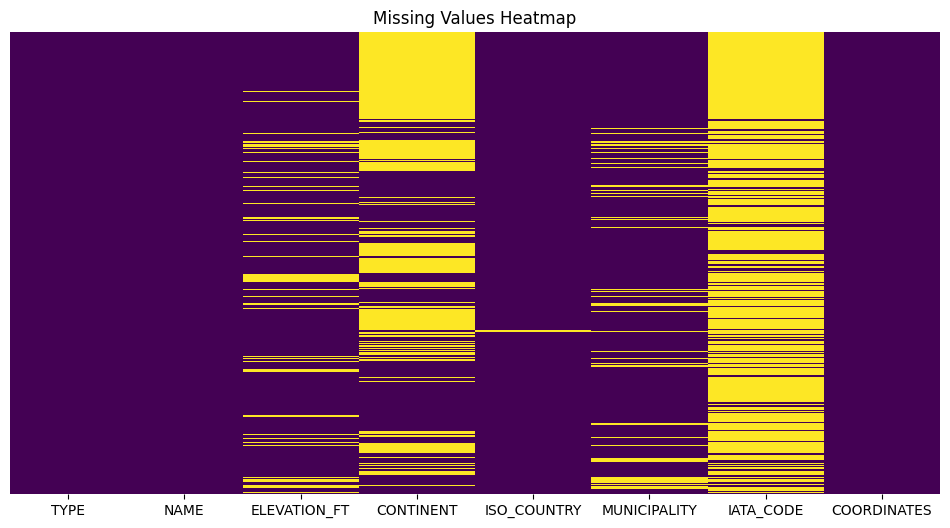

Filled NaNs in ISO_COUNTRY with constant: Unknown


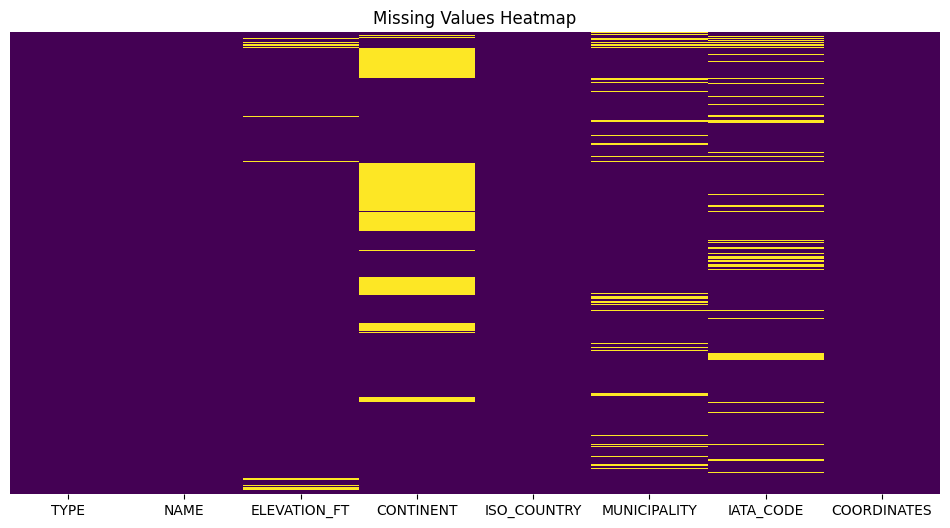

Dropped columns with all NULLs: []
Dropped columns with > 99% NULLs: []
Checking fully duplicated rows.
Found 2 duplicates (0.04%).
Dropped duplicates. New shape: (5145, 8)
Filled NaNs in ELEVATION_FT with mean: 1015.57
Filled NaNs in CONTINENT with constant: Unknown
Filled NaNs in MUNICIPALITY with constant: Unknown
Filled NaNs in IATA_CODE with constant: Unknown

 Generating Outlier Summary Report...
         Column  Skewness  Kurtosis  Outlier Count
0  ELEVATION_FT      3.11     13.15            563

Analyzing Outliers for: ELEVATION_FT using IQR


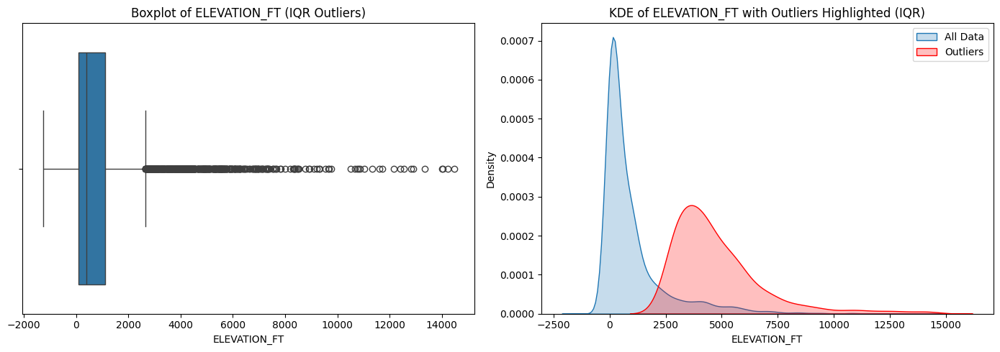


Outlier Capping Summary for 'ELEVATION_FT':
  Median: 403.00
  MAD: 373.00
  Boundaries: [30.00, 776.00]
  Rows capped: 2556 (49.68%)

Analyzing Outliers for: ELEVATION_FT using IQR


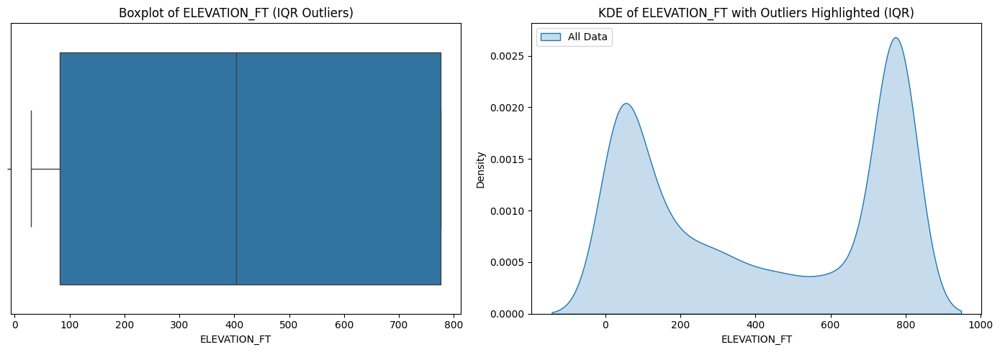


 Cleaned dataset saved to: /Users/gouribenni/Data_Challenge_Capital_One/data/cleaned/airports_cleaned.csv


In [4]:

# if __name__ == "__main__":
# === 1. Load Raw Data ===
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
data_dir = os.path.join(project_root, 'data', 'raw')
file_path = os.path.join(data_dir, 'Airport_Codes.csv')
print(f"\n Loading data from: {file_path}")
ac = pd.read_csv(file_path)

# === 2. Initial Conversion Error Analysis ===
convert_dtypes = {
    'TYPE': 'string', 'NAME': 'string', 'ELEVATION_FT': 'float',
    'CONTINENT': 'string', 'ISO_COUNTRY': 'string',
    'MUNICIPALITY': 'string', 'IATA_CODE': 'string', 'COORDINATES': 'string'
}
report = ProfileReport(df=ac, title="Airports Data")
report.to_notebook_iframe()

df_cleaned, error_reports, _ = analyze_conversion_errors(ac, convert_dtypes)
print_error_report(error_reports)

# === 3. Apply Cleaning ===
numeric_columns = ['ELEVATION_FT']
ac = apply_cleaning_to_numeric_columns(ac, numeric_columns)

print("Error check after conversion")
# === 4. Recheck Conversion ===
df_cleaned, error_reports, _ = analyze_conversion_errors(ac, convert_dtypes)
print_error_report(error_reports)

# === 5. Null Checks ===
plot_missing_values(ac)
null_values, na_cols = check_nulls(ac)

# === 6. Column Classification ===
categorical_dict_cols = classify_columns(ac)

# === 7. Filtering ===
filter_dataset_dict = {'TYPE': ['medium_airport', 'large_airport'], 'ISO_COUNTRY': ['US']}
ac, cat_na_cols, num_na_cols = filter_dataset_based_on_user(ac, filter_dataset_dict, na_cols)

# === 8. Imputation ===
ac = multi_strategy_imputer(ac, num_cols=num_na_cols, cat_cols=cat_na_cols,
                                num_strategy='median', cat_strategy='constant', constant_fill='Unknown')

# === 9. Drop NULL Columns ===
plot_missing_values(ac)
ac, _ = drop_all_null_columns(ac)
ac, _ = drop_high_null_columns(ac, threshold=99)

# === 10. Deduplication ===
ac, _ = check_and_handle_duplicates(ac)

# === 11. Final NA Imputation ===
null_values, na_cols = check_nulls(ac)
cat_na_dict = classify_columns(ac[na_cols])
ac = multi_strategy_imputer(ac,
                            num_cols=cat_na_dict['numerical'],
                            cat_cols=cat_na_dict['categorical'],
                            num_strategy='mean', cat_strategy='constant', constant_fill='Unknown')

# === 12. Outlier Handling ===
outlier_cols = categorical_dict_cols['numerical']
print("\n Generating Outlier Summary Report...")
outlier_report_df = outlier_summary_report(ac, outlier_cols, method='iqr')
print(outlier_report_df)
batch_plot_outliers(ac, outlier_cols, method='iqr')

for col in outlier_cols:
    ac = cap_and_report_outliers(ac, column=col, k=1)
    #print_outlier_summary(ac, col, k=3)
batch_plot_outliers(ac, outlier_cols, method='iqr')

# === 13. Save Final Output ===
cleaned_path = os.path.abspath(os.path.join(os.getcwd(), '..', 'data', 'cleaned', 'airports_cleaned.csv'))
ac.to_csv(cleaned_path, index=False)
print(f"\n Cleaned dataset saved to: {cleaned_path}")


## Flights QC 

In [7]:

if __name__ == "__main__":
    # === Load Flights Data ===
    file_path = os.path.abspath(os.path.join(os.getcwd(), '..', 'data', 'raw', 'Flights.csv'))
    print(f"\n Loading data from: {file_path}")
    ac = pd.read_csv(file_path)

    # === Dtype Mapping ===
    convert_dtypes = {
        'FL_DATE': 'date', 'OP_CARRIER': 'string', 'TAIL_NUM': 'string', 'OP_CARRIER_FL_NUM': 'string',
        'ORIGIN_AIRPORT_ID': 'string', 'ORIGIN': 'string', 'ORIGIN_CITY_NAME': 'string',
        'DEST_AIRPORT_ID': 'string', 'DESTINATION': 'string', 'DEST_CITY_NAME': 'string',
        'DEP_DELAY': 'float', 'ARR_DELAY': 'float', 'CANCELLED': 'float',
        'AIR_TIME': 'float', 'DISTANCE': 'float', 'OCCUPANCY_RATE': 'float'
    }

    df_cleaned, error_reports, _ = analyze_conversion_errors(ac, convert_dtypes)
    print_error_report(error_reports)


 Loading data from: /Users/gouribenni/capital_one_presentation/Data_Challenge_Capital_One/data/raw/Flights.csv

====== Conversion Error Summary ======

╒════════════════╤════════════════════════╤══════════════════╕
│ Column         │ Error Type             │ Details          │
╞════════════════╪════════════════════════╪══════════════════╡
│ FL_DATE        │ Invalid characters     │ Invalid: //      │
├────────────────┼────────────────────────┼──────────────────┤
│ TAIL_NUM       │ Original value was NaN │                  │
├────────────────┼────────────────────────┼──────────────────┤
│ DEP_DELAY      │ Original value was NaN │                  │
├────────────────┼────────────────────────┼──────────────────┤
│ ARR_DELAY      │ Original value was NaN │                  │
├────────────────┼────────────────────────┼──────────────────┤
│ AIR_TIME       │ Original value was NaN │                  │
├────────────────┼────────────────────────┼──────────────────┤
│ AIR_TIME       │ Invalid c

In [8]:
df_cleaned

,FL_DATE,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,DEST_AIRPORT_ID,DESTINATION,DEST_CITY_NAME,DEP_DELAY,ARR_DELAY,CANCELLED,AIR_TIME,DISTANCE,OCCUPANCY_RATE,FL_DATE_conversion_success,FL_DATE_converted,OP_CARRIER_conversion_success,OP_CARRIER_converted,TAIL_NUM_conversion_success,TAIL_NUM_converted,OP_CARRIER_FL_NUM_conversion_success,OP_CARRIER_FL_NUM_converted,ORIGIN_AIRPORT_ID_conversion_success,ORIGIN_AIRPORT_ID_converted,ORIGIN_conversion_success,ORIGIN_converted,ORIGIN_CITY_NAME_conversion_success,ORIGIN_CITY_NAME_converted,DEST_AIRPORT_ID_conversion_success,DEST_AIRPORT_ID_converted,DESTINATION_conversion_success,DESTINATION_converted,DEST_CITY_NAME_conversion_success,DEST_CITY_NAME_converted,DEP_DELAY_conversion_success,DEP_DELAY_converted,ARR_DELAY_conversion_success,ARR_DELAY_converted,CANCELLED_conversion_success,CANCELLED_converted,AIR_TIME_conversion_success,AIR_TIME_converted,DISTANCE_conversion_success,DISTANCE_converted,OCCUPANCY_RATE_conversion_success,OCCUPANCY_RATE_converted
0,2019-03-02,WN,N955WN,4591,14635,RSW,"Fort Myers, FL",11042,CLE,"Cleveland, OH",-8.0,-6.0,0.0,143.0,1025.0,0.970000,True,2019-03-02,True,WN,True,N955WN,True,4591,True,14635,True,RSW,True,"Fort Myers, FL",True,11042,True,CLE,True,"Cleveland, OH",True,-8.0,True,-6.0,True,0.0,True,143.0,True,1025.0,True,0.970000
1,2019-03-02,WN,N8686A,3231,14635,RSW,"Fort Myers, FL",11066,CMH,"Columbus, OH",1.0,5.0,0.0,135.0,930.0,0.550000,True,2019-03-02,True,WN,True,N8686A,True,3231,True,14635,True,RSW,True,"Fort Myers, FL",True,11066,True,CMH,True,"Columbus, OH",True,1.0,True,5.0,True,0.0,True,135.0,True,930.0,True,0.550000
2,2019-03-02,WN,N201LV,3383,14635,RSW,"Fort Myers, FL",11066,CMH,"Columbus, OH",0.0,4.0,0.0,132.0,930.0,0.910000,True,2019-03-02,True,WN,True,N201LV,True,3383,True,14635,True,RSW,True,"Fort Myers, FL",True,11066,True,CMH,True,"Columbus, OH",True,0.0,True,4.0,True,0.0,True,132.0,True,930.0,True,0.910000
3,2019-03-02,WN,N413WN,5498,14635,RSW,"Fort Myers, FL",11066,CMH,"Columbus, OH",11.0,14.0,0.0,136.0,930.0,0.670000,True,2019-03-02,True,WN,True,N413WN,True,5498,True,14635,True,RSW,True,"Fort Myers, FL",True,11066,True,CMH,True,"Columbus, OH",True,11.0,True,14.0,True,0.0,True,136.0,True,930.0,True,0.670000
4,2019-03-02,WN,N7832A,6933,14635,RSW,"Fort Myers, FL",11259,DAL,"Dallas, TX",0.0,-17.0,0.0,151.0,1005.0,0.620000,True,2019-03-02,True,WN,True,N7832A,True,6933,True,14635,True,RSW,True,"Fort Myers, FL",True,11259,True,DAL,True,"Dallas, TX",True,0.0,True,-17.0,True,0.0,True,151.0,True,1005.0,True,0.620000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1915881,3/23/19,AA,N903NN,1433,15370,TUL,"Tulsa, OK",11057,CLT,"Charlotte, NC",-9.0,-6.0,0.0,112,****,0.794884,False,NaT,True,AA,True,N903NN,True,1433,True,15370,True,TUL,True,"Tulsa, OK",True,11057,True,CLT,True,"Charlotte, NC",True,-9.0,True,-6.0,True,0.0,True,112.0,False,NaN,True,0.794884
1915882,3/24/19,AA,N965AN,1433,15370,TUL,"Tulsa, OK",11057,CLT,"Charlotte, NC",-2.0,-1.0,0.0,106,****,0.538399,False,NaT,True,AA,True,N965AN,True,1433,True,15370,True,TUL,True,"Tulsa, OK",True,11057,True,CLT,True,"Charlotte, NC",True,-2.0,True,-1.0,True,0.0,True,106.0,False,NaN,True,0.538399
1915883,3/25/19,AA,N979NN,1433,15370,TUL,"Tulsa, OK",11057,CLT,"Charlotte, NC",-8.0,-25.0,0.0,106,****,0.955579,False,NaT,True,AA,True,N979NN,True,1433,True,15370,True,TUL,True,"Tulsa, OK",True,11057,True,CLT,True,"Charlotte, NC",True,-8.0,True,-25.0,True,0.0,True,106.0,False,NaN,True,0.955579
1915884,3/26/19,AA,N872NN,1433,15370,TUL,"Tulsa, OK",11057,CLT,"Charlotte, NC",-9.0,-6.0,0.0,112,****,0.595344,False,NaT,True,AA,True,N872NN,True,1433,True,15370,True,TUL,True,"Tulsa, OK",True,11057,True,CLT,True,"Charlotte, NC",True,-9.0,True,-6.0,True,0.0,True,112.0,False,NaN,True,0.595344



 Loading data from: /Users/gouribenni/Data_Challenge_Capital_One/data/raw/Flights.csv


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


%|                                                                                       | 0/16 [00:00<?, ?it/s]
%|████▉                                                                          | 1/16 [00:15<03:53, 15.54s/it]
100%|██████████████████████████████████████████████████████████████████████████████| 16/16 [00:15<00:00,  1.01it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


====== Conversion Error Summary ======

╒════════════════╤════════════════════════╤══════════════════╕
│ Column         │ Error Type             │ Details          │
╞════════════════╪════════════════════════╪══════════════════╡
│ FL_DATE        │ Invalid characters     │ Invalid: //      │
├────────────────┼────────────────────────┼──────────────────┤
│ TAIL_NUM       │ Original value was NaN │                  │
├────────────────┼────────────────────────┼──────────────────┤
│ DEP_DELAY      │ Original value was NaN │                  │
├────────────────┼────────────────────────┼──────────────────┤
│ ARR_DELAY      │ Original value was NaN │                  │
├────────────────┼────────────────────────┼──────────────────┤
│ AIR_TIME       │ Original value was NaN │                  │
├────────────────┼────────────────────────┼──────────────────┤
│ AIR_TIME       │ Invalid characters     │ Invalid: Two     │
├────────────────┼────────────────────────┼──────────────────┤
│ AIR_TIME    

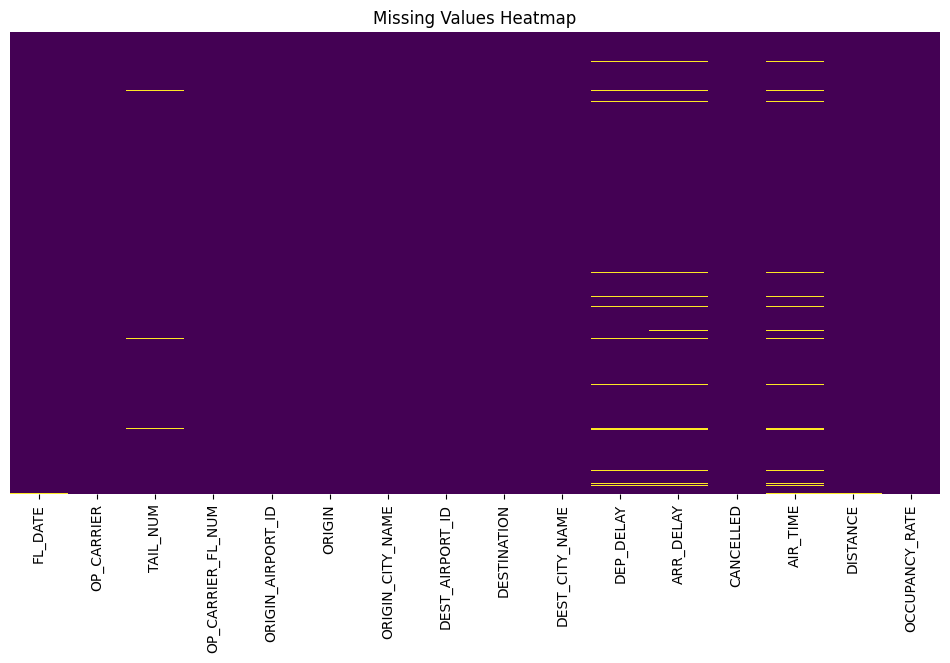

Dropped columns with all NULLs: []
Dropped columns with > 99% NULLs: []
Checking fully duplicated rows.
Found 4900 duplicates (0.26%).
Dropped duplicates. New shape: (1859862, 16)


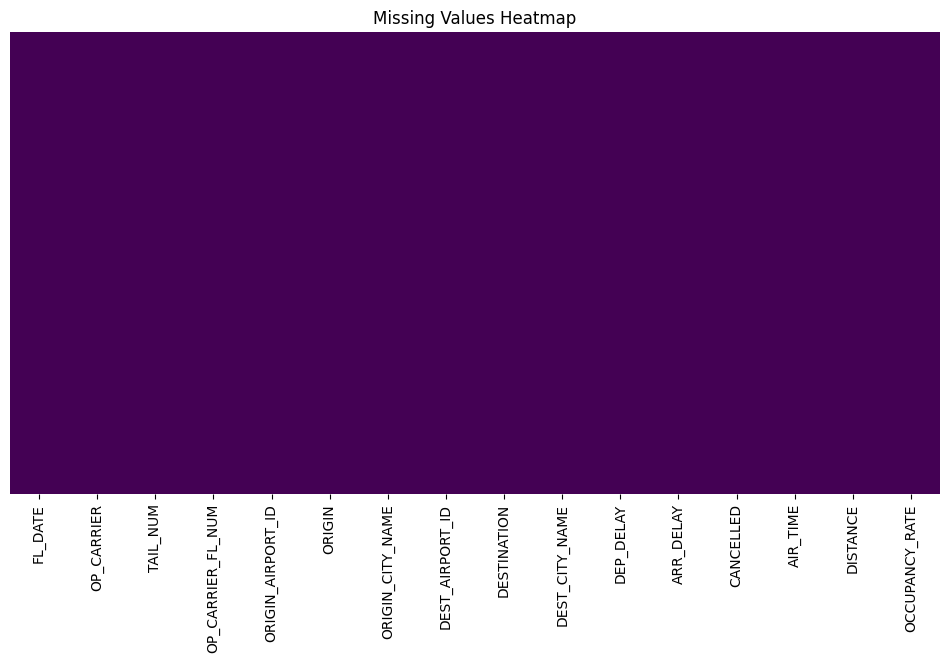

Filled NaNs in ARR_DELAY with mean: 5.66
Filled NaNs in AIR_TIME with mean: 109.34
Filled NaNs in DISTANCE with mean: 772.27
Filled NaNs in OCCUPANCY_RATE with mean: 0.65
Filled NaNs in FL_DATE with constant: Unknown

 Outlier Summary Report:
              Column  Skewness  Kurtosis  Outlier Count
0  ORIGIN_AIRPORT_ID      0.07     -1.31              0
1    DEST_AIRPORT_ID      0.07     -1.31              0
2          DEP_DELAY     10.08    180.19         245838
3          ARR_DELAY      9.01    153.50         174587
4           AIR_TIME      1.55      3.46          93854
5           DISTANCE      1.54      2.94          98770
6     OCCUPANCY_RATE     -0.00     -1.20              0

Analyzing Outliers for: ORIGIN_AIRPORT_ID using IQR


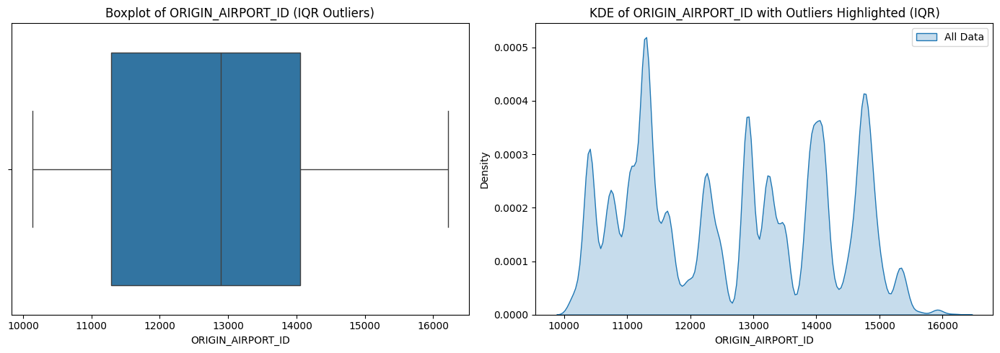


Analyzing Outliers for: DEST_AIRPORT_ID using IQR


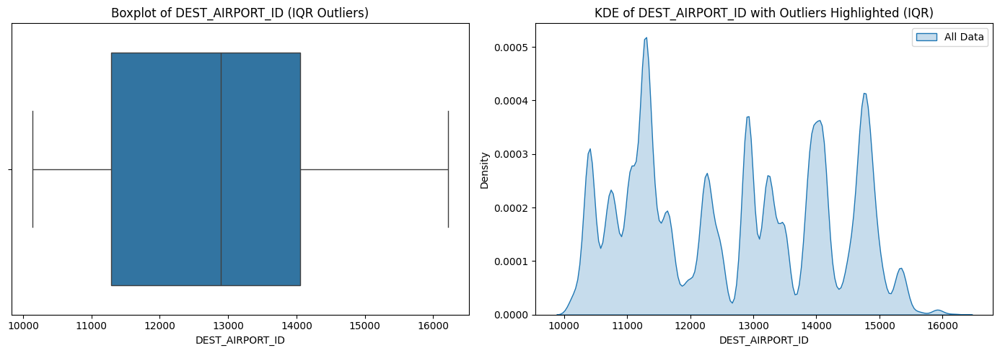


Analyzing Outliers for: DEP_DELAY using IQR


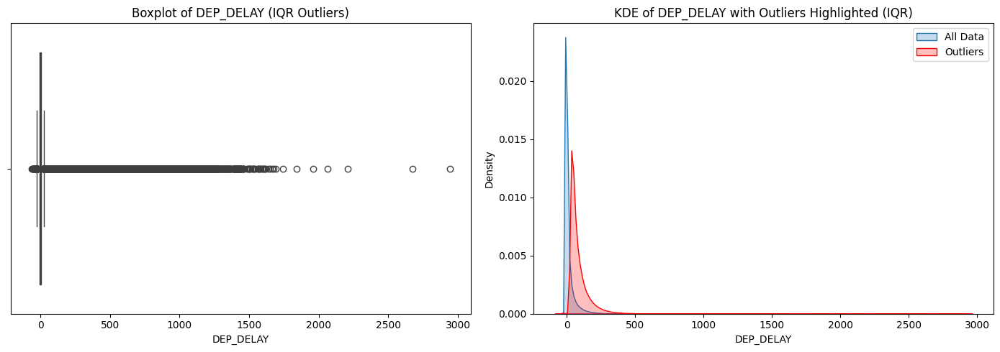


Analyzing Outliers for: ARR_DELAY using IQR


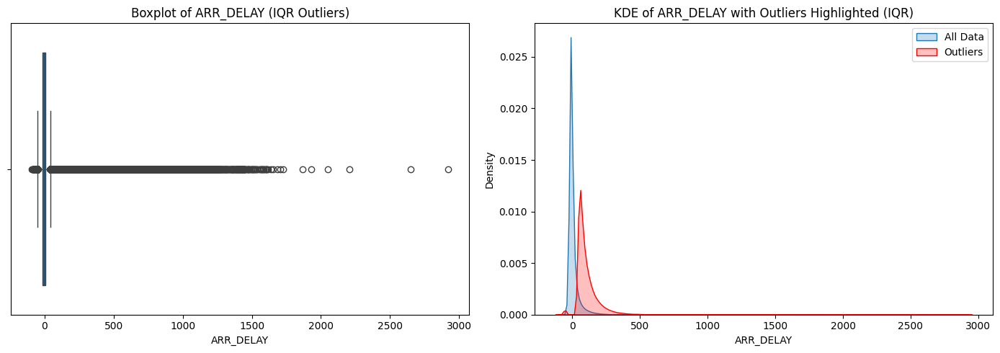


Analyzing Outliers for: AIR_TIME using IQR


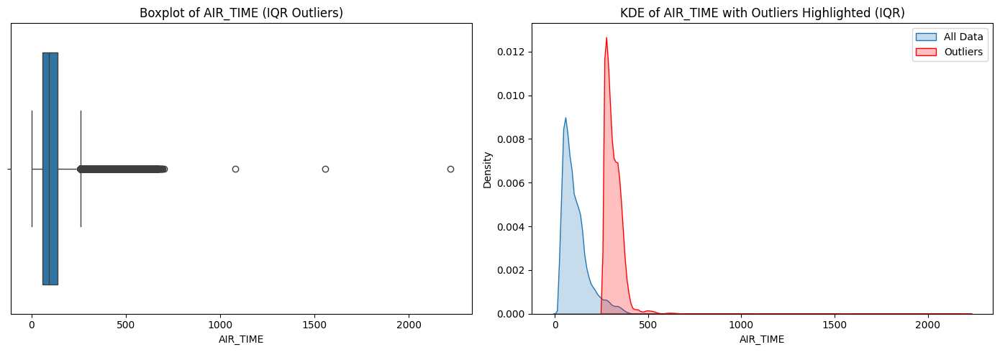


Analyzing Outliers for: DISTANCE using IQR


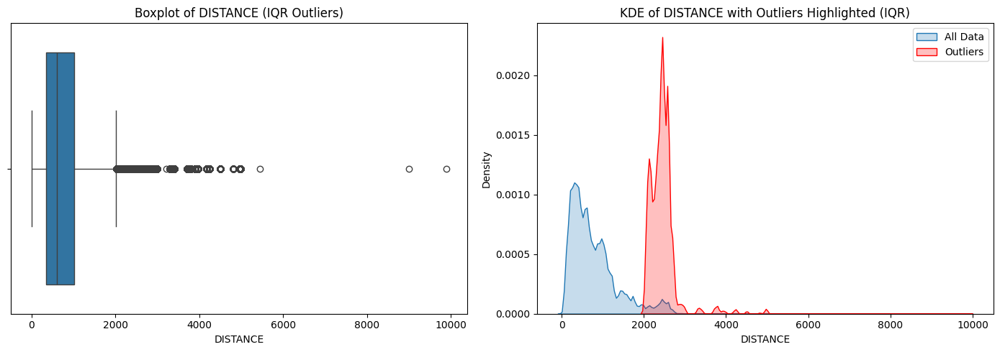


Analyzing Outliers for: OCCUPANCY_RATE using IQR


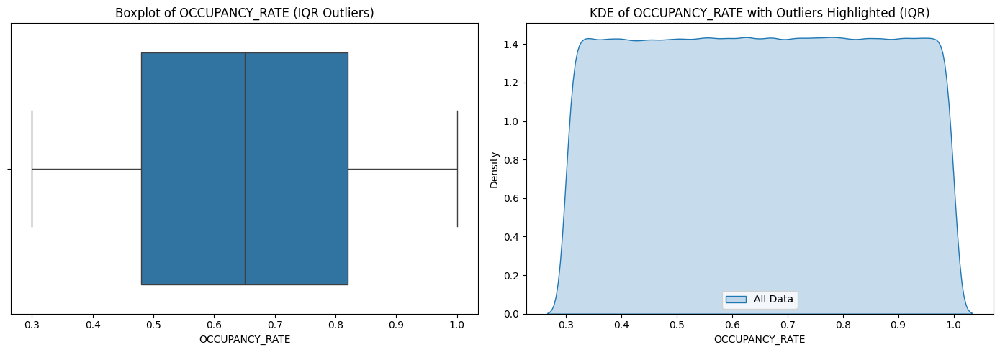


Outlier Capping Summary for 'ORIGIN_AIRPORT_ID':
  Median: 12889.00
  MAD: 1456.00
  Boundaries: [8521.00, 17257.00]
  Rows capped: 0 (0.00%)

Outlier Capping Summary for 'DEST_AIRPORT_ID':
  Median: 12889.00
  MAD: 1456.00
  Boundaries: [8521.00, 17257.00]
  Rows capped: 0 (0.00%)

Outlier Capping Summary for 'DEP_DELAY':
  Median: -2.00
  MAD: 5.00
  Boundaries: [-17.00, 13.00]
  Rows capped: 366220 (19.69%)

Outlier Capping Summary for 'ARR_DELAY':
  Median: -6.00
  MAD: 11.00
  Boundaries: [-39.00, 27.00]
  Rows capped: 259072 (13.93%)

Outlier Capping Summary for 'AIR_TIME':
  Median: 91.00
  MAD: 38.00
  Boundaries: [-23.00, 205.00]
  Rows capped: 182046 (9.79%)

Outlier Capping Summary for 'DISTANCE':
  Median: 612.00
  MAD: 314.00
  Boundaries: [-330.00, 1554.00]
  Rows capped: 188539 (10.14%)

Outlier Capping Summary for 'OCCUPANCY_RATE':
  Median: 0.65
  MAD: 0.17
  Boundaries: [0.14, 1.16]
  Rows capped: 0 (0.00%)

Analyzing Outliers for: ORIGIN_AIRPORT_ID using IQR


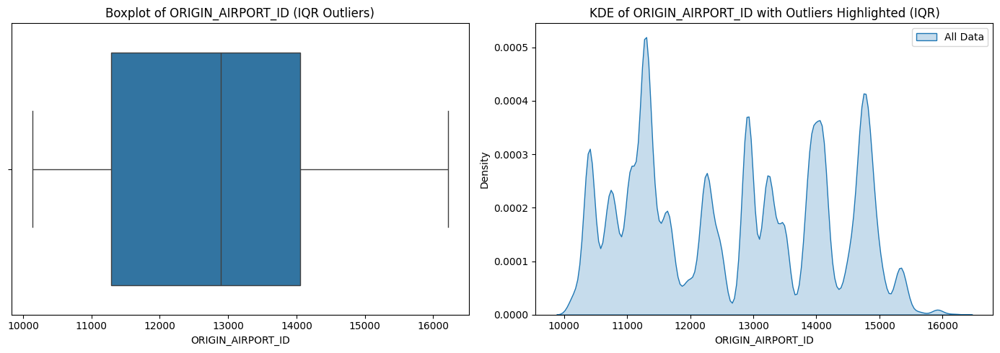


Analyzing Outliers for: DEST_AIRPORT_ID using IQR


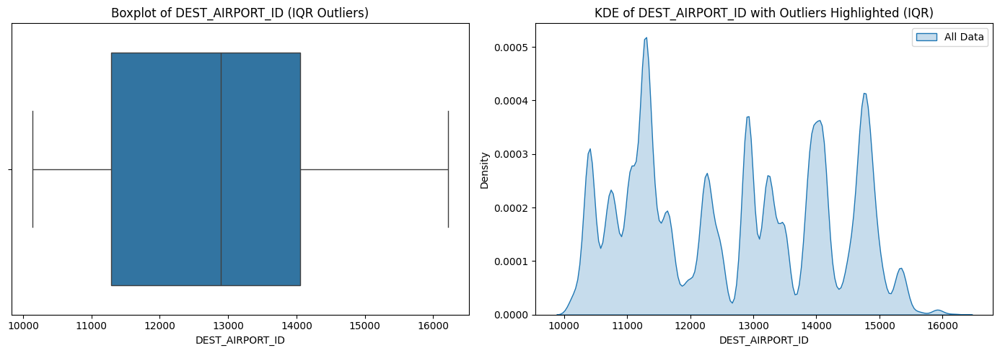


Analyzing Outliers for: DEP_DELAY using IQR


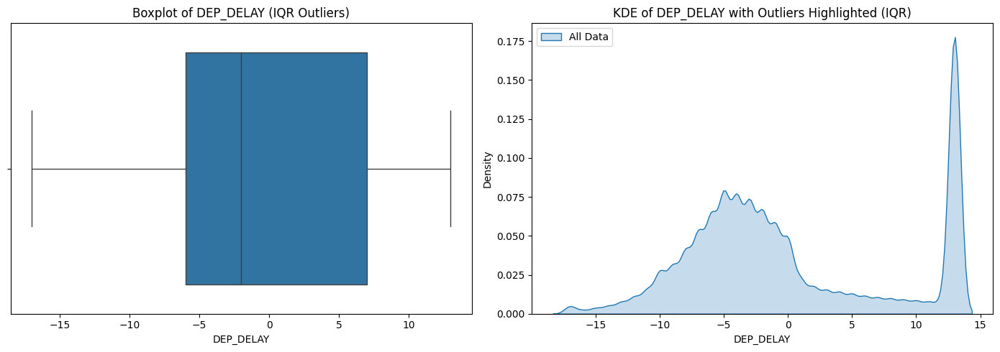


Analyzing Outliers for: ARR_DELAY using IQR


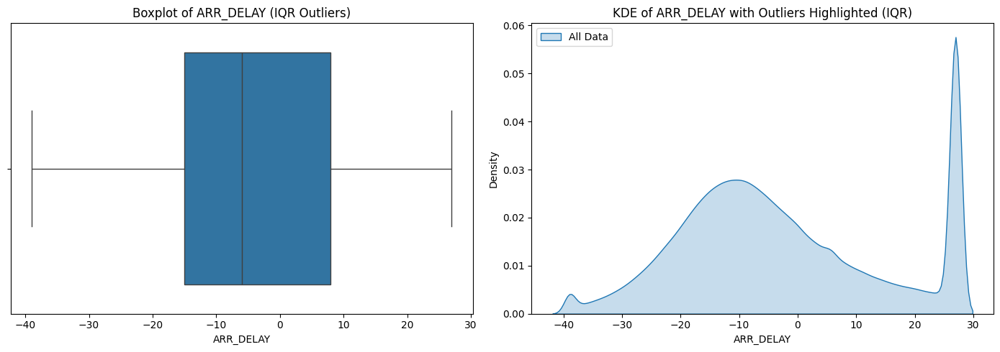


Analyzing Outliers for: AIR_TIME using IQR


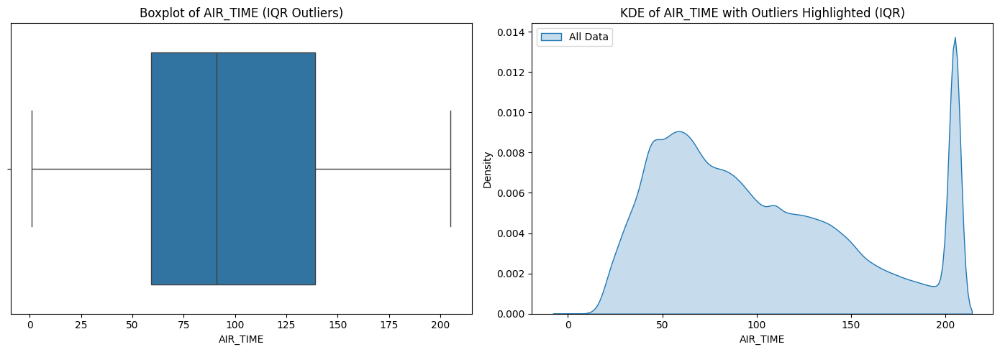


Analyzing Outliers for: DISTANCE using IQR


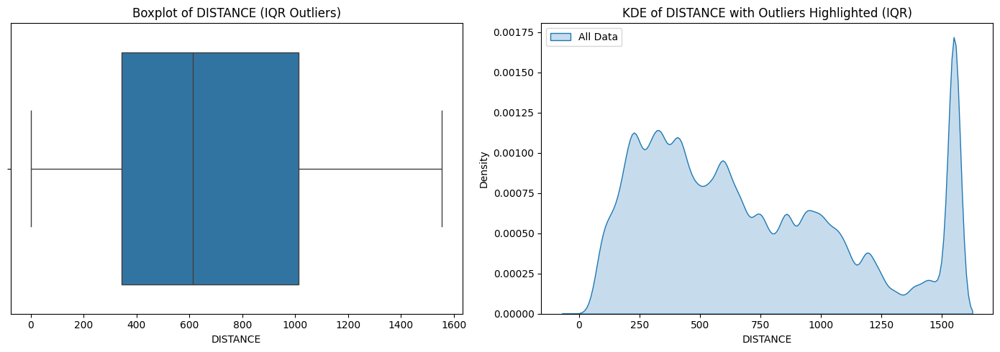


Analyzing Outliers for: OCCUPANCY_RATE using IQR


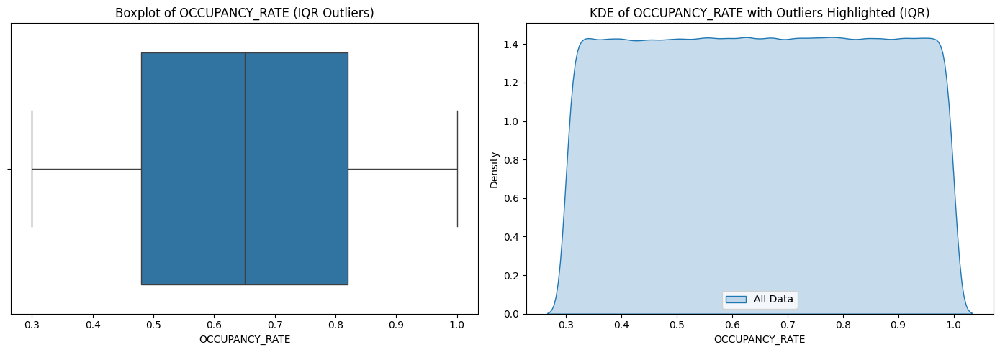


 Cleaned flights dataset saved to: /Users/gouribenni/Data_Challenge_Capital_One/data/cleaned/flights_cleaned.csv


In [5]:

if __name__ == "__main__":
    # === Load Flights Data ===
    file_path = os.path.abspath(os.path.join(os.getcwd(), '..', 'data', 'raw', 'Flights.csv'))
    print(f"\n Loading data from: {file_path}")
    ac = pd.read_csv(file_path)

    # === Dtype Mapping ===
    convert_dtypes = {
        'FL_DATE': 'date', 'OP_CARRIER': 'string', 'TAIL_NUM': 'string', 'OP_CARRIER_FL_NUM': 'string',
        'ORIGIN_AIRPORT_ID': 'string', 'ORIGIN': 'string', 'ORIGIN_CITY_NAME': 'string',
        'DEST_AIRPORT_ID': 'string', 'DESTINATION': 'string', 'DEST_CITY_NAME': 'string',
        'DEP_DELAY': 'float', 'ARR_DELAY': 'float', 'CANCELLED': 'float',
        'AIR_TIME': 'float', 'DISTANCE': 'float', 'OCCUPANCY_RATE': 'float'
    }
    report = ProfileReport(df=ac, title="Flights Data")
    report.to_notebook_iframe()

    df_cleaned, error_reports, _ = analyze_conversion_errors(ac, convert_dtypes)
    print_error_report(error_reports)

    # === Clean Known Numeric Columns ===
    numeric_columns = ['AIR_TIME', 'DISTANCE', 'OCCUPANCY_RATE']
    ac = apply_cleaning_to_numeric_columns(ac, numeric_columns)

    # Fix dates manually
    ac['FL_DATE'] = pd.to_datetime(ac['FL_DATE'], errors='coerce')
    print("Error check after conversion")
    # Recheck Conversion Errors
    df_cleaned, error_reports, _ = analyze_conversion_errors(ac, convert_dtypes)
    print_error_report(error_reports)

    # === Initial Null Check ===
    plot_missing_values(ac)
    null_values, na_cols = check_nulls(ac)

    # === Filter Non-Cancelled Flights ===
    filter_dict = {'CANCELLED': [0.0]}
    ac, cat_cols_na, num_cols_na = filter_dataset_based_on_user(ac, filter_dict, na_cols)

    # === Impute ===
    ac = multi_strategy_imputer(ac, num_cols=num_cols_na, cat_cols=cat_cols_na,
                                 num_strategy='median', cat_strategy='constant', constant_fill='Unknown')

    # === Drop null-heavy columns ===
    ac, _ = drop_all_null_columns(ac)
    ac, _ = drop_high_null_columns(ac, 99)

    # === Dedupe ===
    ac, _ = check_and_handle_duplicates(ac)

    # === Final Null Check + Impute ===
    plot_missing_values(ac)
    null_values, na_cols = check_nulls(ac)
    na_col_types = classify_columns(ac[na_cols])
    ac = multi_strategy_imputer(ac,
                                num_cols=na_col_types['numerical'],
                                cat_cols=na_col_types['categorical'],
                                num_strategy='mean', cat_strategy='constant', constant_fill='Unknown')

    # === Outlier Summary & Capping ===
    all_col_types = classify_columns(ac)
    outlier_cols = all_col_types['numerical']
    print("\n Outlier Summary Report:")
    report = outlier_summary_report(ac, outlier_cols, method='iqr')
    print(report)
    batch_plot_outliers(ac, outlier_cols, method='iqr')
    #columns_to_cap = ['DEP_DELAY', 'ARR_DELAY', 'AIR_TIME', 'DISTANCE', 'OCCUPANCY_RATE']
    for col in outlier_cols:
        ac = cap_and_report_outliers(ac, col, k=3)
        #print_outlier_summary(ac, col, k=3)
        
    batch_plot_outliers(ac, outlier_cols, method='iqr')

    # === Save Cleaned ===
    cleaned_path = os.path.abspath(os.path.join(os.getcwd(), '..', 'data', 'cleaned', 'flights_cleaned.csv'))
    ac.to_csv(cleaned_path, index=False)
    print(f"\n Cleaned flights dataset saved to: {cleaned_path}")


## Tickets QC 


 Loading data from: /Users/gouribenni/Data_Challenge_Capital_One/data/raw/Tickets.csv


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


%|                                                                                       | 0/12 [00:00<?, ?it/s]
100%|██████████████████████████████████████████████████████████████████████████████| 12/12 [00:11<00:00,  1.06it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


 Running Conversion Error Analysis...

====== Conversion Error Summary ======

╒════════════╤════════════════════════╤══════════════╕
│ Column     │ Error Type             │ Details      │
╞════════════╪════════════════════════╪══════════════╡
│ PASSENGERS │ Original value was NaN │              │
├────────────┼────────────────────────┼──────────────┤
│ ITIN_FARE  │ Invalid characters     │ Invalid: $$$ │
├────────────┼────────────────────────┼──────────────┤
│ ITIN_FARE  │ Invalid characters     │ Invalid: $   │
├────────────┼────────────────────────┼──────────────┤
│ ITIN_FARE  │ Original value was NaN │              │
╘════════════╧════════════════════════╧══════════════╛
Error check after conversion

 Final Conversion Check After Cleaning

====== Conversion Error Summary ======

╒════════════╤════════════════════════╤═══════════╕
│ Column     │ Error Type             │ Details   │
╞════════════╪════════════════════════╪═══════════╡
│ PASSENGERS │ Original value was NaN │          

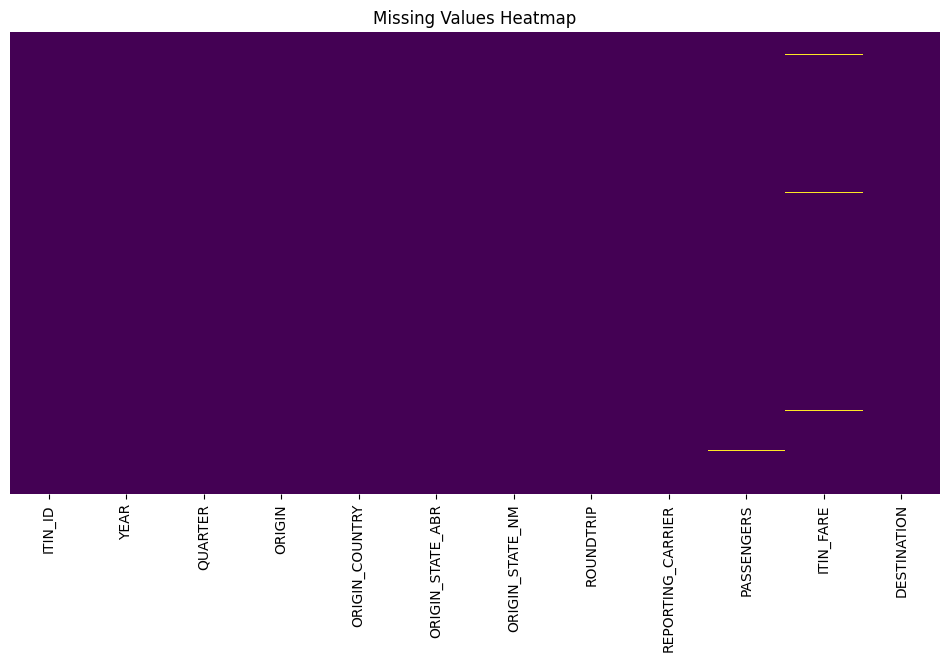


📊 Null Summary:
       Column  Total Count  Null Count    Null %
0   ITIN_FARE      1167285        4136  0.354326
1  PASSENGERS      1167285        1977  0.169367
Dropped columns with all NULLs: []
Dropped columns with > 99% NULLs: []
Checking fully duplicated rows.
Found 95121 duplicates (13.42%).
Dropped duplicates. New shape: (661036, 12)


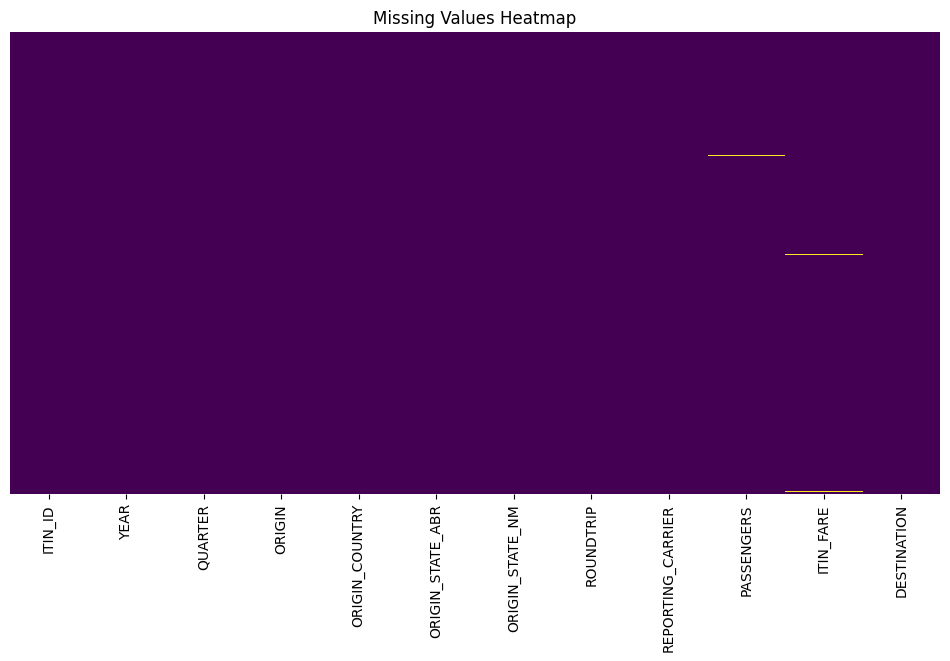

Filled NaNs in PASSENGERS with median: 1.0
Filled NaNs in ITIN_FARE with median: 415.0
\ Outlier Summary Before Capping:
       Column  Skewness  Kurtosis  Outlier Count
0     ITIN_ID     -1.86      1.48         105754
1  PASSENGERS     29.87   1903.21         144434
2   ITIN_FARE      5.73    272.35          28777

Analyzing Outliers for: ITIN_ID using IQR


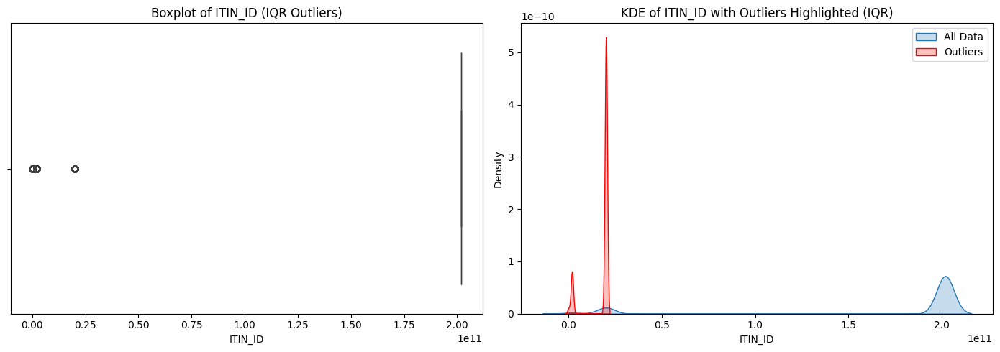


Analyzing Outliers for: PASSENGERS using IQR


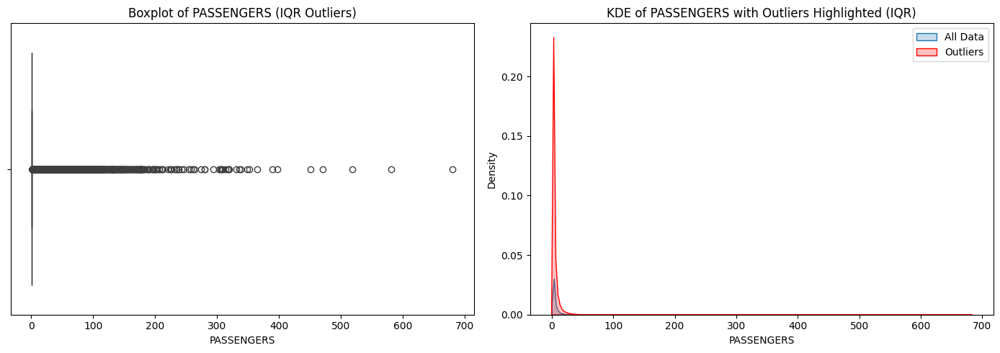


Analyzing Outliers for: ITIN_FARE using IQR


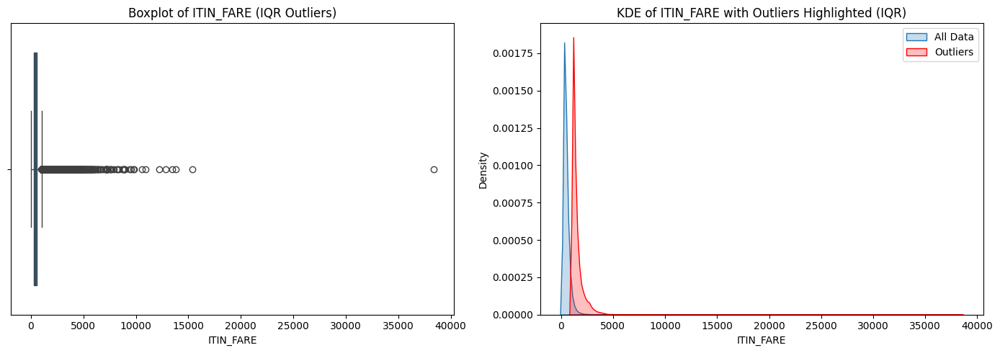


Outlier Capping Summary for 'ITIN_ID':
  Median: 201912817518.50
  MAD: 1264230.50
  Boundaries: [201909024827.00, 201916610210.00]
  Rows capped: 105754 (16.00%)

Outlier Capping Summary for 'PASSENGERS':
  Median: 1.00
  MAD: 0.00
  Boundaries: [1.00, 1.00]
  Rows capped: 144434 (21.85%)

Outlier Capping Summary for 'ITIN_FARE':
  Median: 415.00
  MAD: 152.00
  Boundaries: [-41.00, 871.00]
  Rows capped: 55867 (8.45%)

Analyzing Outliers for: ITIN_ID using IQR


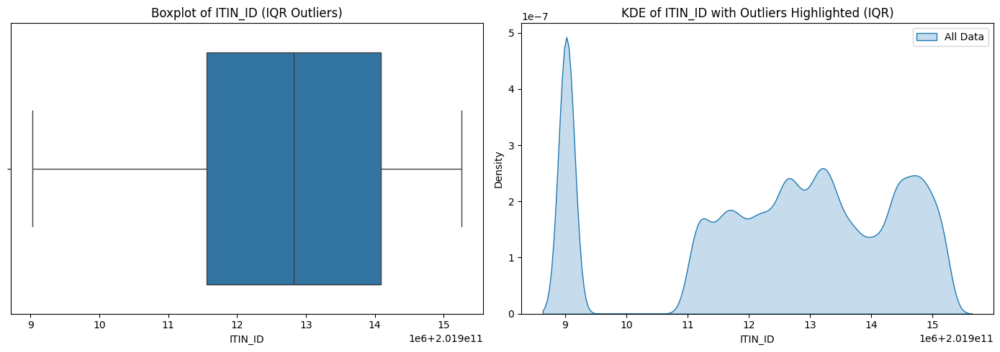


Analyzing Outliers for: PASSENGERS using IQR


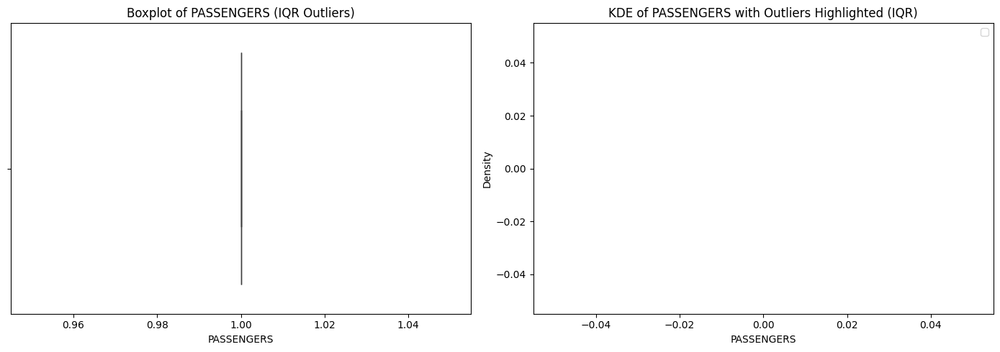


Analyzing Outliers for: ITIN_FARE using IQR


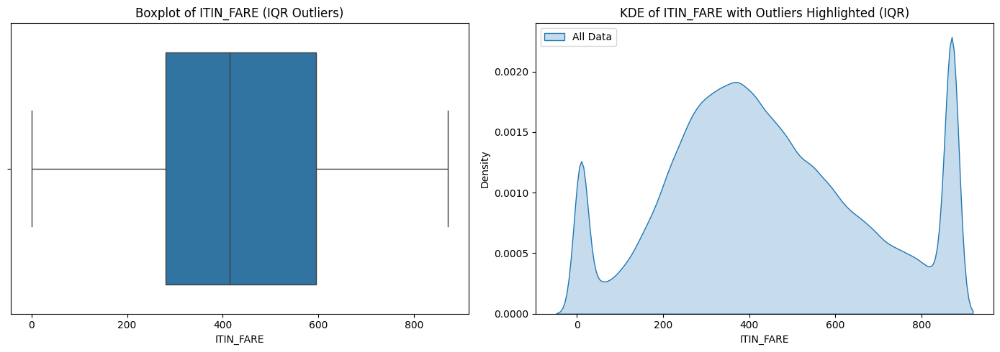


 Cleaned Tickets Data saved to: /Users/gouribenni/Data_Challenge_Capital_One/data/cleaned/tickets_cleaned.csv


In [6]:


# Load dataset
# === Load Tickets Data ===
file_path = os.path.abspath(os.path.join(os.getcwd(), '..', 'data', 'raw', 'Tickets.csv'))
print(f"\n Loading data from: {file_path}")
tickets_df = pd.read_csv(file_path)

# Step 1: Define dtypes and run conversion analysis
convert_dtypes = {
    'ITIN_ID': 'string', 'YEAR': 'string', 'QUARTER': 'string', 'ORIGIN': 'string', 'ORIGIN_COUNTRY': 'string',
    'ORIGIN_STATE_ABR': 'string', 'ORIGIN_STATE_NM': 'string', 'ROUNDTRIP': 'float',
    'REPORTING_CARRIER': 'string', 'PASSENGERS': 'int', 'ITIN_FARE': 'float', 'DESTINATION': 'string'
}

report = ProfileReport(df=tickets_df, title="Tickets Data")
report.to_notebook_iframe()

print("\n Running Conversion Error Analysis...")
df_cleaned, error_reports, _ = analyze_conversion_errors(tickets_df, convert_dtypes)
print_error_report(error_reports)

# Step 2: Apply numeric cleanup and standardization
numeric_cols = ['ROUNDTRIP', 'PASSENGERS', 'ITIN_FARE']
tickets_df = apply_cleaning_to_numeric_columns(tickets_df, numeric_cols)

# Step 3: Recheck errors
print("Error check after conversion")
df_cleaned, error_reports, _ = analyze_conversion_errors(tickets_df, convert_dtypes)
print("\n Final Conversion Check After Cleaning")
print_error_report(error_reports)

# Step 4: Null checks
plot_missing_values(tickets_df)
null_summary, na_cols = check_nulls(tickets_df)
print("\n Null Summary:")
print(null_summary)

# Step 5: Filter for ROUNDTRIP == 1.0
filter_dict = {'ROUNDTRIP': [1.0]}
tickets_df, cat_na_after_filter, num_na_after_filter = filter_dataset_based_on_user(tickets_df, filter_dict, na_cols)

# Step 6: Imputation
tickets_df = multi_strategy_imputer(
    tickets_df,
    num_cols=num_na_after_filter,
    cat_cols=cat_na_after_filter,
    num_strategy="median",
    cat_strategy="constant",
    constant_fill="Unknown"
)

# Step 7: Drop null-heavy columns
tickets_df, _ = drop_all_null_columns(tickets_df)
tickets_df, _ = drop_high_null_columns(tickets_df, threshold=99)

# Step 8: Remove duplicates
tickets_df, _ = check_and_handle_duplicates(tickets_df)

# Step 9: Final impute if anything remains
plot_missing_values(tickets_df)
null_summary, na_cols = check_nulls(tickets_df)
cat_na_final = classify_columns(tickets_df[na_cols])
tickets_df = multi_strategy_imputer(
    tickets_df,
    num_cols=cat_na_final['numerical'],
    cat_cols=cat_na_final['categorical'],
    num_strategy="median",
    cat_strategy="constant",
    constant_fill="Unknown"
)

# Step 10: Outlier Treatment
classified_cols = classify_columns(tickets_df)
outlier_cols = [col for col in classified_cols['numerical'] if tickets_df[col].nunique() > 1]

print("\ Outlier Summary Before Capping:")
outlier_df = outlier_summary_report(tickets_df, outlier_cols, method='iqr')
print(outlier_df)
batch_plot_outliers(tickets_df, outlier_cols, method='iqr')

for col in outlier_cols:
    tickets_df = cap_and_report_outliers(tickets_df, col, k=3)
batch_plot_outliers(tickets_df, outlier_cols, method='iqr')
    #print_outlier_summary(tickets_df, col, k=3)

# Step 11: Save Cleaned File
cleaned_path = os.path.abspath(os.path.join(os.getcwd(), '..', 'data', 'cleaned', 'tickets_cleaned.csv'))
tickets_df.to_csv(cleaned_path, index=False)
print(f"\n Cleaned Tickets Data saved to: {cleaned_path}")